# **MSc Data Science thesis project: Micromobility vehicle parking**
## **Clustering and regression modeling**


## **1 Import libraries**

In [1]:
# Import libraries
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
import pygeos
from shapely.geometry.collection import GeometryCollection
from matplotlib.colors import LogNorm
from matplotlib.lines import Line2D

import numpy as np
import os
import json
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from matplotlib.colors import rgb2hex
%matplotlib inline

from scipy import stats
import sklearn

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import RobustScaler

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error

from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import SelectFromModel
from sklearn.feature_selection import SequentialFeatureSelector


from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.utils.fixes import loguniform
from sklearn import preprocessing

from sklearn import linear_model
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import PoissonRegressor
from sklearn.neural_network import MLPRegressor
from xgboost.sklearn import XGBRegressor

from kmodes.kprototypes import KPrototypes
from sklearn.cluster import KMeans
from kmodes.kmodes import KModes
from sklearn.metrics import silhouette_score
from sklearn import metrics
from kneed import KneeLocator

# Set main directories
main_path = '...'
shapefiles_path = main_path + '/vehicle_parking_shapefiles/'

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 100)

import warnings
warnings.filterwarnings('ignore')

C:\Users\jfieb\anaconda3\envs\py37\lib\site-packages\geopandas\_compat.py:115: UserWarning: The Shapely GEOS version (3.8.0-CAPI-1.13.1 ) is incompatible with the GEOS version PyGEOS was compiled with (3.10.1-CAPI-1.16.0). Conversions between both will be slow.
  shapely_geos_version, geos_capi_version_string


## **2 Read the data**

In [2]:
vehicle_parking_2019 = pd.read_csv(main_path + 'vehicle_parking_with_neighborhood_2019.csv',delimiter=',',encoding = 'utf-8-sig')
vehicle_parking_2020 = pd.read_csv(main_path + 'vehicle_parking_with_neighborhood_2020.csv',delimiter=',',encoding = 'utf-8-sig')
vehicle_parking_2021 = pd.read_csv(main_path + 'vehicle_parking_with_neighborhood_2021.csv',delimiter=',',encoding = 'utf-8-sig')

In [3]:
# Read the shapefiles for each year
shapefile_2019 = gpd.read_file(shapefiles_path + '/sct_ams_fiets_poly_2019_v2')
shapefile_2020 = gpd.read_file(shapefiles_path + '/sct_ams_fiets_poly_2020_v1/sct_ams_fiets_poly_2020_v1')
shapefile_2021 = gpd.read_file(shapefiles_path + '/sct_ams_fiets_poly_2021/')

shapefile_2019 = shapefile_2019.rename(columns={"Alias_2018": "section_2018", "straat":"street"})
shapefile_2020 = shapefile_2020.rename(columns={"Alias_2018": "section_2018", "straat":"street"})
shapefile_2021 = shapefile_2021.rename(columns={"id": "section_2018", "straat":"street"})

In [4]:
vehicle_parking_2019 = shapefile_2019[['section_2018','geometry']].merge(vehicle_parking_2019.drop(['geometry'], axis=1), how='inner', on=['section_2018'])
vehicle_parking_2020 = shapefile_2020[['section_2018','geometry']].merge(vehicle_parking_2020.drop(['geometry'], axis=1), how='inner', on=['section_2018'])
vehicle_parking_2021 = shapefile_2021[['section_2018','geometry']].merge(vehicle_parking_2021.drop(['geometry'], axis=1), how='inner', on=['section_2018'])

# Delete entries with missing geometry
vehicle_parking_2019.dropna(subset=['geometry'], inplace=True)
vehicle_parking_2020.dropna(subset=['geometry'], inplace=True)
vehicle_parking_2021.dropna(subset=['geometry'], inplace=True)

vehicle_parking_2019['geometry_line'] = vehicle_parking_2019['geometry'].boundary # for better visualisation
vehicle_parking_2020['geometry_line'] = vehicle_parking_2020['geometry'].boundary # for better visualisation
vehicle_parking_2021['geometry_line'] = vehicle_parking_2021['geometry'].boundary # for better visualisation

print(vehicle_parking_2019.shape)
print(vehicle_parking_2020.shape)
print(vehicle_parking_2021.shape)

(32653, 374)
(32647, 374)
(32691, 375)


In [5]:
parking_data = [vehicle_parking_2019, vehicle_parking_2020, vehicle_parking_2021]
vehicle_parking = pd.concat(parking_data)
print(vehicle_parking.shape)

del vehicle_parking_2019
del vehicle_parking_2020
del vehicle_parking_2021
del shapefile_2019
del shapefile_2020
del shapefile_2021

(97991, 375)


## 3 Remove outliers

In [6]:
vehicle_parking = vehicle_parking.loc[(vehicle_parking.occupancy_per_100m2 < 100) | (vehicle_parking.occupancy_per_100m2.isna())]
vehicle_parking.shape

(97853, 375)

## 4 Transform data

In [7]:
function_features = vehicle_parking.main_function.unique().tolist()
horeca_features = vehicle_parking.main_horeca.unique().tolist()

# Create new features with total venues per location for non-residential functions and horeca
vehicle_parking['total_function'] = vehicle_parking[function_features].sum(axis=1)
vehicle_parking['total_horeca'] = vehicle_parking[horeca_features].sum(axis=1)

# Create new features with the frequency of occurence per location
for feature in function_features:
    vehicle_parking[feature +'_freq_per_loc'] = (vehicle_parking[feature]/vehicle_parking['total_function']).round(2)
for feature in horeca_features:
    vehicle_parking[feature +'_freq_per_loc'] = (vehicle_parking[feature]/vehicle_parking['total_horeca']).round(2)
features = (vehicle_parking.main_function.unique() + '_freq_per_loc').tolist() + (vehicle_parking.main_horeca.unique()  + '_freq_per_loc').tolist()
vehicle_parking[features] = vehicle_parking[features].fillna(0)

# Create new features with the frequency of occurence per venue category (total)
for feature in function_features:
    vehicle_parking[feature +'_freq_per_func_sum'] = (vehicle_parking[feature]/vehicle_parking[feature].sum()).round(2)
for feature in horeca_features:
    vehicle_parking[feature +'_freq_per_func_sum'] = (vehicle_parking[feature]/vehicle_parking[feature].sum()).round(2)
features = (vehicle_parking.main_function.unique() + '_freq_per_func_sum').tolist() + (vehicle_parking.main_horeca.unique()  + '_freq_per_func_sum').tolist()
vehicle_parking[features] = vehicle_parking[features].fillna(0)

# Create new features with the frequency of occurence per venue category (mean)
for feature in function_features:
    vehicle_parking[feature +'_freq_per_func_mean'] = (vehicle_parking[feature]/vehicle_parking[feature].mean()).round(2)
for feature in horeca_features:
    vehicle_parking[feature +'_freq_per_func_mean'] = (vehicle_parking[feature]/vehicle_parking[feature].mean()).round(2)
features = (vehicle_parking.main_function.unique() + '_freq_per_func_mean').tolist() + (vehicle_parking.main_horeca.unique()  + '_freq_per_func_mean').tolist()
vehicle_parking[features] = vehicle_parking[features].fillna(0)

## 5 Standardize / Normalize data

In [8]:
binary_variabales = ['canal','bridge',
       'is_shopping_area_within','is_shopping_area_intersects','Within City district center',
       'Within Core shopping area', 'Within Location for peripheral shops',
       'Within Neighborhood center', 'Within Quarter center large',
       'Within Quarter center small', 'Within Traffic locations',
       'Intersects City district center', 'Intersects Core shopping area',
       'Intersects Location for peripheral shops',
       'Intersects Neighborhood center', 'Intersects Quarter center large',
       'Intersects Quarter center small', 'Intersects Traffic locations']

# Define the variables to be normalized / standardized
features = vehicle_parking.main_function.unique().tolist() + \
            (vehicle_parking.main_function.unique() + '_per_100m2').tolist() + \
            vehicle_parking.main_horeca.unique().tolist() + \
            (vehicle_parking.main_horeca.unique() + '_per_100m2').tolist() + \
            (vehicle_parking.main_function.unique() + '_freq_per_func_mean').tolist() + \
            (vehicle_parking.main_horeca.unique()  + '_freq_per_func_mean').tolist() + \
            (vehicle_parking.main_function.unique() + '_freq_per_func_sum').tolist() + \
            (vehicle_parking.main_horeca.unique()  + '_freq_per_func_sum').tolist() + \
            (vehicle_parking.main_function.unique() + '_freq_per_loc').tolist() + \
            (vehicle_parking.main_horeca.unique()  + '_freq_per_loc').tolist() + \
            ['Metro','Tram','WON','WRK','VZN', 'WON_PERC','WRK_PERC','VZN_PERC',
             'capacity', 'occupancy','occupancy_outside','occupancy_inside', 
             'net_point_occupancy', 'gross_point_occupancy', 'occupancy_per_100m2',
             'occupancy_outside_per_100m2', 'occupancy_inside_per_100m2', 'capacity_per_100m2',
             'occupancy_inside_per_100m2_mean','occupancy_outside_per_100m2_mean', 
             'occupancy_per_100m2_mean', 'capacity_per_100m2_mean', 'occupancy_outside_per_100m2_lag1']
#             'occupancy_outside_per_100m2_mean_mean','occupancy_outside_per_100m2_lag1_mean','cluster']

In [9]:
# Apply the different techniques to the variables
min_max_scaler = MinMaxScaler()
# stand_scaler = StandardScaler()
# robust_scaler = RobustScaler(quantile_range=(25, 75))

for feature in features:
    vehicle_parking[feature +'_minmax'] = min_max_scaler.fit_transform(vehicle_parking[[feature]])
#     vehicle_parking[feature +'_stand'] = stand_scaler.fit_transform(vehicle_parking[[feature]])
#     vehicle_parking[feature +'_robust'] = robust_scaler.fit_transform(vehicle_parking[[feature]])

In [10]:
# Convert features using percentage to a decimal value so it also fits in the 0 to 1 range
features = ['WON_PERC','WRK_PERC','VZN_PERC']
for feature in features:
    vehicle_parking[feature +'_freq'] = (vehicle_parking[feature]/100).round(2)

## 6 Clustering

In [14]:
# Setup definitions for the clustering pipeline

def plot_scores(wcss, silhouette_scores):
    fig, axes = plt.subplots(1, 2, sharex='none',sharey='none', figsize=(12,3))
    axes[0].plot(range(2, 16), wcss)
    axes[0].set_title('Elbow method')
    axes[0].set(xlabel='Number of clusters (K)', ylabel='WCSS')
    axes[1].plot(range(2, 16), silhouette_scores, marker='o')
    axes[1].set_title('Silhouette score')
    axes[1].set(xlabel='Number of clusters (K)', ylabel='Silhouette score')
    plt.show()
    kl = KneeLocator(range(2, 16), wcss, curve="convex", direction="decreasing")
    print('Elbow at: ' + str(kl.elbow))

def plot_clusters(df):
    f, ax = plt.subplots(1, figsize=(25,25))
    ax.set_axis_off()
    ax = df.set_geometry('geometry_line').plot(linewidth = 0.4, ax=ax, cmap= 'tab20',categorical = True, column = 'neigh_label', legend = True, aspect=1, legend_kwds={'loc':'upper left', 'bbox_to_anchor':(0.84,0.95), 'title_fontsize':12, 'title':'Cluster'})
    plt.show()
    
def evaluate_parking_per_cluster(df):
    plt.figure(figsize=(2.5,2.5))
    ax = sns.boxplot(palette = 'husl', x="neigh_label", y="occupancy_outside_per_100m2_mean", data = df.loc[(df.occupancy_outside_per_100m2_mean <= 40)])
    ax.set_xticklabels(ax.get_xticklabels(), rotation = 45, horizontalalignment = "right")
    ax.set_xlabel('Clusters', fontsize=11)
    ax.set_ylabel('Vehicles per 100m2', fontsize=11)
    plt.show()
    stat, p = stats.kruskal(df.neigh_label, df.occupancy_outside_per_100m2_mean, nan_policy='omit')
    print('Kruskal Wallis')
    print('Test statistic: ', str(stat), '   P-value: ', str(p))  
    print(df.groupby(['neigh_label'])['neigh_label'].count())
    
def evaluate_feature_per_cluster(df, x_feature, y_feature):
    plt.figure(figsize=(2.5,2.5))
    ax = sns.boxplot(palette = 'husl', x=y_feature, y=x_feature, data = df)
    ax.set_xticklabels(ax.get_xticklabels(), rotation = 45, horizontalalignment = "right")
    ax.set_xlabel(y_feature, fontsize=11)
    ax.set_ylabel(x_feature, fontsize=11)
    plt.show()
    stat, p = stats.kruskal(df[y_feature] , df[x_feature], nan_policy='omit')
    print('Kruskal Wallis')
    print('Test statistic: ', str(stat), '   P-value: ', str(p))      

def kprototypes_scores(columns, categorical, df):
    temp = df[columns].dropna()
    costs = []
    silhouette_scores = []
    numerical = [columns[i] for i in list(set(list(range(0, len(columns)))) - set(categorical))]
    for i in range(2, 16):
        print('---------------------' + str(i) + '-------------------------')
        kproto = KPrototypes(n_clusters=i, init='Cao', n_init=3, verbose=1)
        temp['neigh_label'] = kproto.fit_predict(temp[columns], categorical=categorical)    
        costs.append(kproto.cost_)
        silhouette_scores.append(silhouette_score(temp[numerical], temp['neigh_label']))   
    plot_scores(costs, silhouette_scores)
    
def kprototypes_clustering(columns, categorical, df, n_clusters):
    temp = df[columns + ['geometry_line', 'occupancy_outside_per_100m2_mean']].dropna()
    kproto = KPrototypes(n_clusters=n_clusters, init='Cao', n_init=3, verbose=1)
    temp['neigh_label'] = kproto.fit_predict(temp[columns], categorical=categorical)
    plot_clusters(temp)
    evaluate_parking_per_cluster(temp)    
    return temp['neigh_label']

In [12]:
df_cluster = vehicle_parking[vehicle_parking.year == 2021]

### 6.1 Clustering with neighborhood features only

---------------------2-------------------------
Initialization method and algorithm are deterministic. Setting n_init to 1.
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 1, iteration: 1/100, moves: 1335, ncost: 14239.891329505359
Run: 1, iteration: 2/100, moves: 3607, ncost: 11254.49428862551
Run: 1, iteration: 3/100, moves: 4468, ncost: 10378.933464937734
Run: 1, iteration: 4/100, moves: 481, ncost: 10361.367240407923
Run: 1, iteration: 5/100, moves: 96, ncost: 10360.735071257377
Run: 1, iteration: 6/100, moves: 17, ncost: 10360.713134546555
Run: 1, iteration: 7/100, moves: 3, ncost: 10360.711546374685
Run: 1, iteration: 8/100, moves: 4, ncost: 10360.710104280424
Run: 1, iteration: 9/100, moves: 0, ncost: 10360.710104280424
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 2, iteration: 1/100, moves: 3664, ncost: 10419.785695309089
Run: 2, iteration: 2/100, moves: 977, ncost: 10365.069222547376
Run: 2, iteration

Run: 1, iteration: 6/100, moves: 3, ncost: 6518.862426693092
Run: 1, iteration: 7/100, moves: 1, ncost: 6518.862210199246
Run: 1, iteration: 8/100, moves: 0, ncost: 6518.862210199246
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 2, iteration: 1/100, moves: 5200, ncost: 7251.8198276857565
Run: 2, iteration: 2/100, moves: 1218, ncost: 7187.97422389295
Run: 2, iteration: 3/100, moves: 779, ncost: 7157.848467391291
Run: 2, iteration: 4/100, moves: 728, ncost: 7101.144407600643
Run: 2, iteration: 5/100, moves: 758, ncost: 7000.5832287910835
Run: 2, iteration: 6/100, moves: 206, ncost: 6994.739651525901
Run: 2, iteration: 7/100, moves: 48, ncost: 6994.320729643243
Run: 2, iteration: 8/100, moves: 10, ncost: 6994.283549840817
Run: 2, iteration: 9/100, moves: 1, ncost: 6994.28222367911
Run: 2, iteration: 10/100, moves: 0, ncost: 6994.28222367911
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 3, iteration: 1/100, moves

Run: 2, iteration: 14/100, moves: 42, ncost: 5158.766532299692
Run: 2, iteration: 15/100, moves: 19, ncost: 5158.75039676184
Run: 2, iteration: 16/100, moves: 11, ncost: 5158.74544763727
Run: 2, iteration: 17/100, moves: 3, ncost: 5158.741193010416
Run: 2, iteration: 18/100, moves: 3, ncost: 5158.738706286504
Run: 2, iteration: 19/100, moves: 3, ncost: 5158.737110388311
Run: 2, iteration: 20/100, moves: 0, ncost: 5158.737110388311
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 3, iteration: 1/100, moves: 5873, ncost: 5769.4789899684765
Run: 3, iteration: 2/100, moves: 1598, ncost: 5618.164783444392
Run: 3, iteration: 3/100, moves: 681, ncost: 5523.429198718744
Run: 3, iteration: 4/100, moves: 343, ncost: 5488.020051006525
Run: 3, iteration: 5/100, moves: 184, ncost: 5485.887287520399
Run: 3, iteration: 6/100, moves: 48, ncost: 5485.762596265877
Run: 3, iteration: 7/100, moves: 24, ncost: 5485

Run: 3, iteration: 6/100, moves: 79, ncost: 4338.589653783419
Run: 3, iteration: 7/100, moves: 58, ncost: 4337.7786234805735
Run: 3, iteration: 8/100, moves: 80, ncost: 4337.2243019316065
Run: 3, iteration: 9/100, moves: 65, ncost: 4336.748214224791
Run: 3, iteration: 10/100, moves: 179, ncost: 4332.392427213808
Run: 3, iteration: 11/100, moves: 354, ncost: 4316.025355186753
Run: 3, iteration: 12/100, moves: 209, ncost: 4310.336742084982
Run: 3, iteration: 13/100, moves: 138, ncost: 4308.29790341076
Run: 3, iteration: 14/100, moves: 97, ncost: 4305.5918066196045
Run: 3, iteration: 15/100, moves: 123, ncost: 4301.297889124871
Run: 3, iteration: 16/100, moves: 125, ncost: 4298.025329852717
Run: 3, iteration: 17/100, moves: 259, ncost: 4267.582598134603
Run: 3, iteration: 18/100, moves: 488, ncost: 4218.7567945523215
Run: 3, iteration: 19/100, moves: 213, ncost: 4212.938252611936
Run: 3, iteration: 20/100, moves: 59, ncost: 4212.4844415604375
Run: 3, iteration: 21/100, moves: 18, ncost: 4

Run: 3, iteration: 8/100, moves: 0, ncost: 4543.3572802372055
Best run was number 1


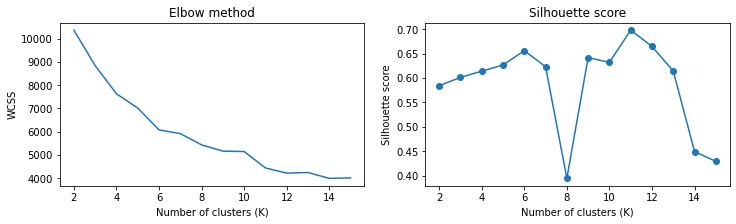

Elbow at: 6


In [13]:
columns  = ['is_shopping_area_intersects', 'public_transport',
            'Healthcare_freq_per_loc', 'Offices_freq_per_loc',
            'Sports_freq_per_loc', 'Religion_freq_per_loc',
            'Retail_freq_per_loc', 'Horeca_freq_per_loc',
            'Culture_freq_per_loc', 'Lodging_freq_per_loc',
            'Companies_freq_per_loc', 'Atelier_freq_per_loc',
            'Education_freq_per_loc', 'Storage_freq_per_loc', 'Public utility_freq_per_loc',
            'District center_freq_per_loc', 'Agricultural_freq_per_loc', 'Cafe_freq_per_loc',
            'Restaurant_freq_per_loc', 
            'WON_PERC_freq','WRK_PERC_freq', 'VZN_PERC_freq',
            'Healthcare_freq_per_func_mean_minmax',
            'Offices_freq_per_func_mean_minmax',
            'Sports_freq_per_func_mean_minmax',
            'Religion_freq_per_func_mean_minmax',
            'Retail_freq_per_func_mean_minmax',
            'Horeca_freq_per_func_mean_minmax',
            'Culture_freq_per_func_mean_minmax',
            'Lodging_freq_per_func_mean_minmax',
            'Companies_freq_per_func_mean_minmax',
            'Atelier_freq_per_func_mean_minmax',
            'Education_freq_per_func_mean_minmax',
            'Storage_freq_per_func_mean_minmax',
            'Public utility_freq_per_func_mean_minmax',
            'District center_freq_per_func_mean_minmax',
            'Agricultural_freq_per_func_mean_minmax']
          
categorical = [0,1]

kprototypes_scores(columns, categorical, df_cluster)

The most optimal number of clusters is k = 6.

Initialization method and algorithm are deterministic. Setting n_init to 1.
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 1, iteration: 1/100, moves: 4319, ncost: 7690.204667599692
Run: 1, iteration: 2/100, moves: 3021, ncost: 6992.80016957282
Run: 1, iteration: 3/100, moves: 1101, ncost: 6945.145487265635
Run: 1, iteration: 4/100, moves: 242, ncost: 6942.216552380608
Run: 1, iteration: 5/100, moves: 64, ncost: 6941.821590907678
Run: 1, iteration: 6/100, moves: 12, ncost: 6941.805288210501
Run: 1, iteration: 7/100, moves: 2, ncost: 6941.803110072757
Run: 1, iteration: 8/100, moves: 0, ncost: 6941.803110072757
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 2, iteration: 1/100, moves: 4572, ncost: 7353.347558255811
Run: 2, iteration: 2/100, moves: 1161, ncost: 7115.535518855352
Run: 2, iteration: 3/100, moves: 356, ncost: 7012.461294513443
Run: 2, iteration: 4/100, moves: 888, ncost: 6639.66529484603
Run: 2, ite

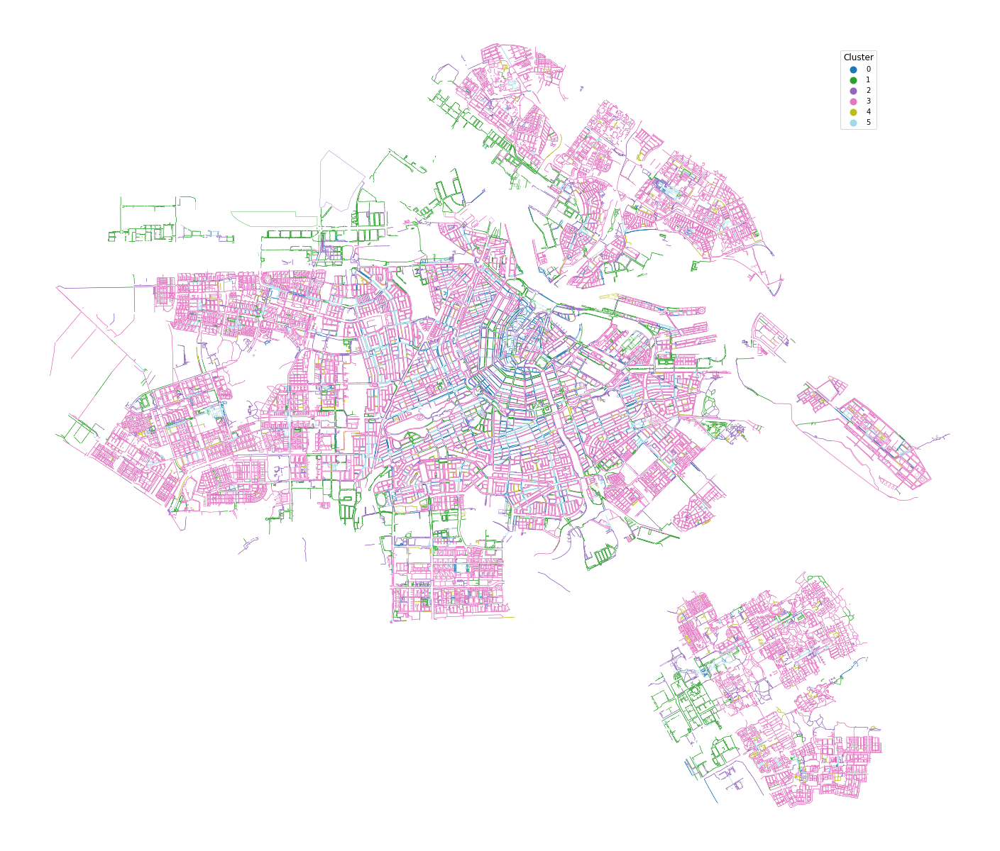

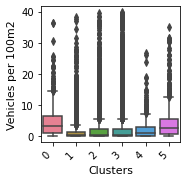

Kruskal Wallis
Test statistic:  11536.305283056614    P-value:  0.0
neigh_label
0      973
1     2970
2     3264
3    22547
4      542
5     1979
Name: neigh_label, dtype: int64


In [15]:
df_cluster['cluster'] = kprototypes_clustering(columns, categorical, df_cluster, 6)

In [16]:
# Categorical variables per cluster
for feature in [columns[i] for i in categorical]:
    temp = pd.crosstab(df_cluster[feature], df_cluster['cluster'],normalize='columns', margins=True)
    display(temp.round(2).style.background_gradient(cmap='Blues', axis=None))

cluster,0.0,1.0,2.0,3.0,4.0,5.0,All
is_shopping_area_intersects,,,,,,,
0,0.420000,0.900000,0.830000,0.950000,0.920000,0.450000,0.880000
1,0.580000,0.100000,0.170000,0.050000,0.080000,0.550000,0.120000


cluster,0.0,1.0,2.0,3.0,4.0,5.0,All
public_transport,,,,,,,
Both,0.030000,0.020000,0.020000,0.000000,0.010000,0.020000,0.010000
Metro,0.010000,0.010000,0.020000,0.010000,0.010000,0.010000,0.010000
None,0.670000,0.880000,0.810000,0.900000,0.900000,0.690000,0.870000
Tram,0.290000,0.090000,0.150000,0.090000,0.090000,0.290000,0.110000


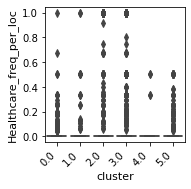

Kruskal Wallis
Test statistic:  55255.26745053749    P-value:  0.0


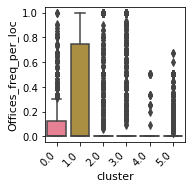

Kruskal Wallis
Test statistic:  52613.23247093394    P-value:  0.0


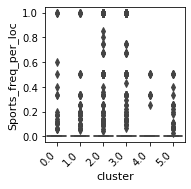

Kruskal Wallis
Test statistic:  55465.47819364017    P-value:  0.0


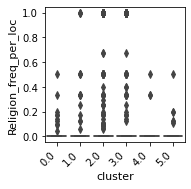

Kruskal Wallis
Test statistic:  55692.95899417926    P-value:  0.0


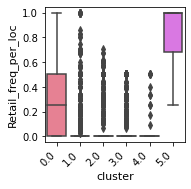

Kruskal Wallis
Test statistic:  52762.43513457787    P-value:  0.0


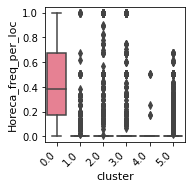

Kruskal Wallis
Test statistic:  53946.314102354765    P-value:  0.0


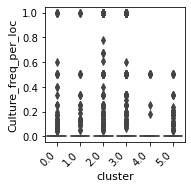

Kruskal Wallis
Test statistic:  55517.22740150851    P-value:  0.0


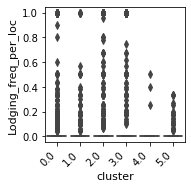

Kruskal Wallis
Test statistic:  55435.003118555425    P-value:  0.0


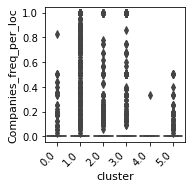

Kruskal Wallis
Test statistic:  54994.78403809564    P-value:  0.0


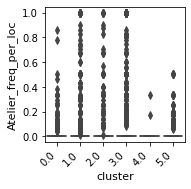

Kruskal Wallis
Test statistic:  55288.52418200139    P-value:  0.0


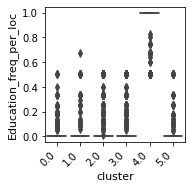

Kruskal Wallis
Test statistic:  54946.960838262115    P-value:  0.0


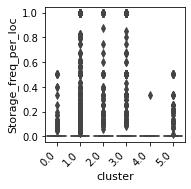

Kruskal Wallis
Test statistic:  55299.10549281445    P-value:  0.0


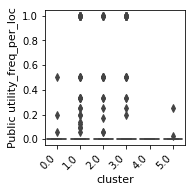

Kruskal Wallis
Test statistic:  55812.02667293211    P-value:  0.0


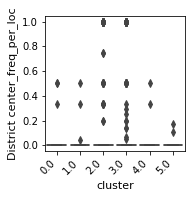

Kruskal Wallis
Test statistic:  55789.002882171844    P-value:  0.0


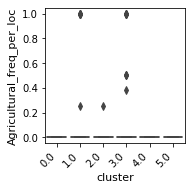

Kruskal Wallis
Test statistic:  55882.24016995218    P-value:  0.0


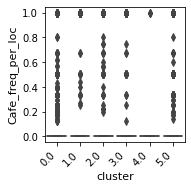

Kruskal Wallis
Test statistic:  55110.503176959    P-value:  0.0


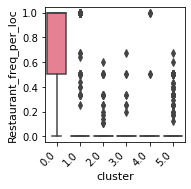

Kruskal Wallis
Test statistic:  54676.3735547206    P-value:  0.0


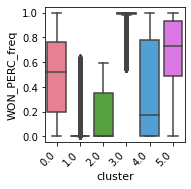

Kruskal Wallis
Test statistic:  41973.927532996044    P-value:  0.0


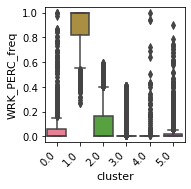

Kruskal Wallis
Test statistic:  49178.895329626015    P-value:  0.0


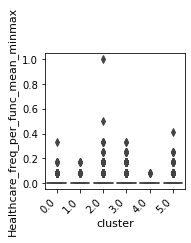

Kruskal Wallis
Test statistic:  55328.96909539851    P-value:  0.0


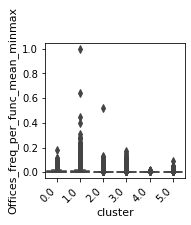

Kruskal Wallis
Test statistic:  53062.489939978805    P-value:  0.0


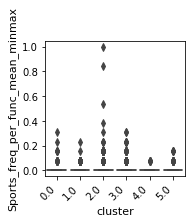

Kruskal Wallis
Test statistic:  55524.263530048374    P-value:  0.0


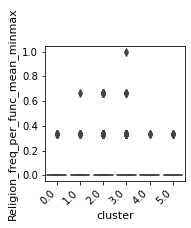

Kruskal Wallis
Test statistic:  55720.24808702498    P-value:  0.0


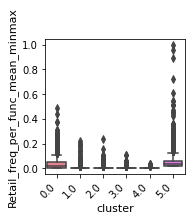

Kruskal Wallis
Test statistic:  53122.99960913902    P-value:  0.0


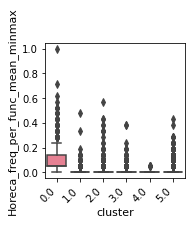

Kruskal Wallis
Test statistic:  54079.11895744407    P-value:  0.0


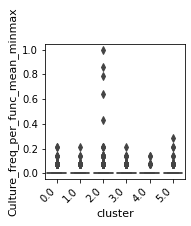

Kruskal Wallis
Test statistic:  55559.307093864496    P-value:  0.0


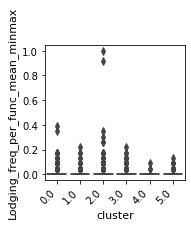

Kruskal Wallis
Test statistic:  55479.23639086063    P-value:  0.0


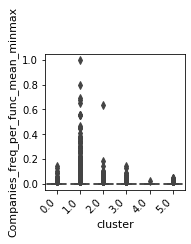

Kruskal Wallis
Test statistic:  55084.76888018057    P-value:  0.0


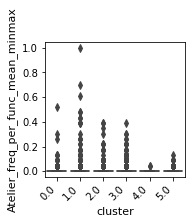

Kruskal Wallis
Test statistic:  55330.76967710609    P-value:  0.0


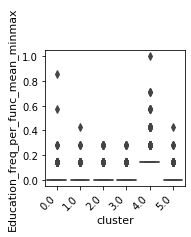

Kruskal Wallis
Test statistic:  55096.33065537751    P-value:  0.0


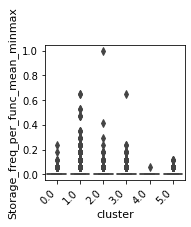

Kruskal Wallis
Test statistic:  55347.971581987986    P-value:  0.0


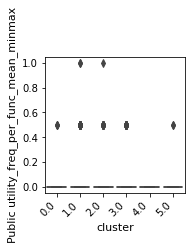

Kruskal Wallis
Test statistic:  55823.15578087871    P-value:  0.0


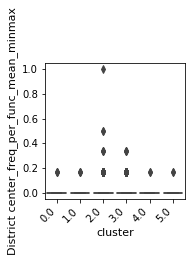

Kruskal Wallis
Test statistic:  55805.213164895606    P-value:  0.0


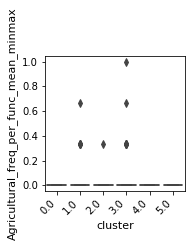

Kruskal Wallis
Test statistic:  55885.42389898247    P-value:  0.0


In [17]:
# Numerical variables per cluster
numerical = [columns[i] for i in list(set(list(range(0, len(columns)))) - set(categorical))]
for feature in numerical:
    evaluate_feature_per_cluster(df_cluster, feature, 'cluster')

In [18]:
df_cluster[numerical + ['cluster', 'VZN_PERC_freq', 'perc_in','perc_out', 'gross_point_occupancy', 'net_point_occupancy', 'capacity_per_100m2','occupancy_outside_per_100m2', 'occupancy_per_100m2', 'occupancy_outside']].groupby('cluster').mean().round(2).transpose()

cluster,0.0,1.0,2.0,3.0,4.0,5.0
Healthcare_freq_per_loc,0.01,0.00,0.03,0.01,0.00,0.01
Offices_freq_per_loc,0.10,0.30,0.05,0.05,0.01,0.04
Sports_freq_per_loc,0.01,0.00,0.04,0.00,0.01,0.00
Religion_freq_per_loc,0.00,0.00,0.02,0.00,0.00,0.00
Retail_freq_per_loc,0.30,0.02,0.02,0.00,0.01,0.85
Horeca_freq_per_loc,0.44,0.01,0.04,0.01,0.00,0.07
Culture_freq_per_loc,0.01,0.00,0.03,0.00,0.01,0.00
Lodging_freq_per_loc,0.05,0.01,0.03,0.00,0.00,0.00
Companies_freq_per_loc,0.01,0.11,0.01,0.01,0.00,0.00
Atelier_freq_per_loc,0.01,0.01,0.01,0.01,0.00,0.01


### 6.2 Clustering with neighborhood and (historical) parking features

In [ ]:
columns  = ['is_shopping_area_intersects', 'public_transport',
            'Healthcare_freq_per_loc', 'Offices_freq_per_loc',
            'Sports_freq_per_loc', 'Religion_freq_per_loc',
            'Retail_freq_per_loc', 'Horeca_freq_per_loc',
            'Culture_freq_per_loc', 'Lodging_freq_per_loc',
            'Companies_freq_per_loc', 'Atelier_freq_per_loc',
            'Education_freq_per_loc', 'Storage_freq_per_loc', 'Public utility_freq_per_loc',
            'District center_freq_per_loc', 'Agricultural_freq_per_loc', 'Cafe_freq_per_loc',
            'Restaurant_freq_per_loc', 
            'WON_PERC_freq','WRK_PERC_freq', 'VZN_PERC_freq', 
            'Healthcare_freq_per_func_mean_minmax',
            'Offices_freq_per_func_mean_minmax',
            'Sports_freq_per_func_mean_minmax',
            'Religion_freq_per_func_mean_minmax',
            'Retail_freq_per_func_mean_minmax',
            'Horeca_freq_per_func_mean_minmax',
            'Culture_freq_per_func_mean_minmax',
            'Lodging_freq_per_func_mean_minmax',
            'Companies_freq_per_func_mean_minmax',
            'Atelier_freq_per_func_mean_minmax',
            'Education_freq_per_func_mean_minmax',
            'Storage_freq_per_func_mean_minmax',
            'Public utility_freq_per_func_mean_minmax',
            'District center_freq_per_func_mean_minmax',
            'Agricultural_freq_per_func_mean_minmax',
            'occupancy_outside_per_100m2_mean_minmax', 'occupancy_per_100m2_mean_minmax', 
            'capacity_per_100m2_mean_minmax']
          
categorical = [0,1]

df_cluster['cluster'] = kprototypes_scores(columns, categorical, df_cluster)

In [19]:
df_cluster[['section_2018','cluster']].head()

,section_2018,cluster
0,13793,3.0
1,12744,3.0
2,21603,3.0
3,34596,3.0
4,15807,2.0


In [21]:
# Save cluster file
# df_cluster[['section_2018','cluster']].to_csv(main_path + 'clusters.csv', index=False)

## 7 Add new features based on clusters

In [22]:
df_cluster = pd.read_csv(main_path + 'clusters.csv',delimiter=',',encoding = 'utf-8-sig')
df_cluster.head()

,section_2018,cluster
0,13793,3.0
1,12744,3.0
2,21603,0.0
3,34596,3.0
4,15807,1.0


In [24]:
vehicle_parking = vehicle_parking.merge(df_cluster[['section_2018','cluster']], how='left', on=['section_2018'])

In [25]:
# Add summary features per cluster
def add_cluster_features(df):
    grouped = df[['cluster','occupancy_outside_per_100m2_mean', 'occupancy_outside_per_100m2_lag1']].groupby('cluster').agg(['mean', 'std'])
    grouped.columns = ["_".join(x) for x in grouped.columns.ravel()]
    grouped = grouped.reset_index()
    df = df.merge(grouped, how='left', on=['cluster'])
    return df

In [26]:
vehicle_parking = add_cluster_features(vehicle_parking)
vehicle_parking = pd.concat([vehicle_parking, pd.get_dummies(vehicle_parking.cluster, prefix = 'cluster', prefix_sep = ' ')], axis=1)
vehicle_parking.shape

(97853, 638)

In [27]:
del df_cluster

## 8 Regression

### 8.1 Data splitting

In [28]:
train = vehicle_parking[vehicle_parking.year != 2021] # Train dataset contains the data for years 2019 and 2020
test = vehicle_parking[vehicle_parking.year == 2021] # Test dataset contains the data for year 2021

print('Train size: ' + str(train.shape[0]))
print('Test size: ' + str(test.shape[0]))

del vehicle_parking

Train size: 65222
Test size: 32631


In [50]:
# Defintion to plot the predictions, actual values and residuals
def plot_preds(df, pred, label):
    fig, axes = plt.subplots(1, 3, sharex='none',sharey='none', figsize=(22.5,7.5))
    cmap = cm.RdYlGn
    cmap_reversed = cmap.reversed()
    axes[0].set_axis_off()
    axes[1].set_axis_off()
    axes[2].set_axis_off()

    df.set_geometry('geometry_line').plot(linewidth = 0.4, ax=axes[0], cmap= cmap_reversed, column = pred, legend = True, aspect=1,  vmin = 0, vmax=15,
                                              legend_kwds={'label': 'Predicted vehicles parked outside','shrink': 0.5, 'pad':-0.05})
    df.set_geometry('geometry_line').plot(linewidth = 0.4, ax=axes[1], cmap= cmap_reversed, column = label, legend = True, aspect=1,  vmin = 0, vmax=15,
                                              legend_kwds={'label': 'Actual vehicles parked outside','shrink': 0.5, 'pad':-0.05})
    df.set_geometry('geometry_line').plot(linewidth = 0.4, ax=axes[2], cmap= 'coolwarm', column = pred + '_resid', legend = True, vmin = -15, vmax = 15,aspect=1,
                                              legend_kwds={'label': 'Residuals','shrink': 0.5, 'pad':-0.05})
    fig.tight_layout(pad=1)
    plt.show()
    
# Definition to get the error metrics
def get_statistics(y_test, pred, label, data_name):
    y_test = y_test.dropna(subset=[pred, label])
    return [data_name,
            mean_absolute_error(y_test[label], y_test[pred]).round(2),
            mean_squared_error(y_test[label], y_test[pred]).round(2),
            mean_squared_error(y_test[label], y_test[pred], squared = False).round(2),
            r2_score(y_test[label], y_test[pred]).round(2)]

# Definition for the training and evaluation pipeline
def train_eval_model(model_name, pred, model, train, test, grid, param_grid, label, features):
    
    print(model_name)
        
    # Split train data into X (predictors or independent) and y (response or dependent) and drop rows with missing values for features or label
    X_train = (train.dropna(subset=[label] + features)[features]).fillna(0)
    y_train = (train.dropna(subset=[label] + features)[['section_2018','street', 'area', 'year', label]]).fillna(0)
    feature_names = X_train.columns   
    
    # Create custom train-validation split (2019 in train and 2020 in validation)
    cvIndices = []
    y_train.reset_index(inplace=True)
    trainIndices = y_train[y_train['year'] == 2019].index.values.astype(int)
    vaildIndices =  y_train[y_train['year'] == 2020].index.values.astype(int)
    cvIndices.append((trainIndices, vaildIndices))

    # Select features by conducting sequential (forward) feature selection
    if len(features) > 1:
        print('Feature selection started')
        sfs = SequentialFeatureSelector(model.fit(X_train, y_train[label]), direction='forward', scoring='neg_mean_squared_error', cv=cvIndices, n_jobs=1)
        sfs_result = sfs.fit(X_train, y_train[label])
        features = feature_names[sfs_result.get_support()]
        print('Selected features: ', features.values)    
    
    # Select hyperparameters by conducting randomized / grid search
    if grid:
        print("Hyperparameter search started")
        grid = RandomizedSearchCV(n_iter = 100, estimator = model.fit(X_train[features], y_train[label]), param_distributions=param_grid, scoring='neg_mean_squared_error', verbose = 3, cv=cvIndices, n_jobs=1, random_state=42)        
#         grid = GridSearchCV(estimator = model.fit(X_train[features], y_train[label]), param_grid=param_grid, scoring='neg_mean_squared_error', verbose = 3, cv=cvIndices, n_jobs=1)
        # Fit the model using the train data
        model_fit = grid.fit(X_train[features], y_train[label])       
        # Print the selected hyperparameters
        print('Best Params: ', model_fit.best_params_)       
        
    else:
        model_fit = model.fit(X_train[features], y_train[label])
        
    # Again split train data into X (predictors or independent) and y (response or dependent) and drop rows with missing values for the features
    X_train = (train.dropna(subset=features)[features]).fillna(0)
    y_train = (train.dropna(subset=features)[['section_2018','street','area', 'year', label]]).fillna(0)
    
    # Predict values for the train data (for evaluation purposes)
    y_train[pred] = model.predict(X_train[features]) 
 
    # Split test data into X (predictors or independent) and y (response or dependent)
    X_test = (test.dropna(subset=features)[features]).fillna(0)
    y_test = test.dropna(subset=features)[['section_2018','street', 'geometry', 'geometry_line', 'area', 'year', label]] 

    # Predict values for the test data
    y_test[pred] = model_fit.predict(X_test[features])  
  
    # Display feature importances
    if (model_name == 'MLP regression') :   
        print("No feature importances")
    else:
        # Create df with feature importances
        importances = pd.DataFrame(data={'Attribute': features,'Importance': model.feature_importances_})
        importances = importances.sort_values(by='Importance', ascending=False)

        # Plot the feature importances
        f, ax = plt.subplots(figsize=(6,3))    
        plt.barh(y=importances.head(15)['Attribute'], width=importances.head(15)['Importance'], color='#087E8B')
        plt.title('Feature importances (MDI)', size=12)
        plt.xticks(rotation=90)
        plt.show()
    
    # Clip predictions to 0 (because there can not be a negative amount of vehicles)
    y_test[pred].clip(lower=0, inplace=True)
    y_train[pred].clip(lower=0, inplace=True)
    
    # Calculate and plot the residuals
    y_test[pred + '_resid'] = y_test[label] - y_test[pred]
    y_train[pred + '_resid'] = y_train[label] - y_train[pred]
    fig, axes = plt.subplots(1, 2, sharex='none',sharey='none', figsize=(7,3.5))
    sns.regplot(ax=axes[0], scatter_kws={'alpha':0.25}, data = y_test, 
                x = pred, y = label, line_kws = {'color' : 'red'}).set(title='Predicted vs Actual',xlabel='Predicted value', ylabel='Actual value')
    sns.regplot(ax=axes[1], scatter_kws={'alpha':0.25}, data = y_test, 
                x = pred, y = pred + '_resid').set(title='Residuals',xlabel='Predicted value', ylabel='Residual')
    axes[1].axhline(0, ls='--')
    fig.tight_layout(pad=1)
    plt.show()

    # Calculate error metrics for the datasets and display them
    print(" ")
    print("Error metrics")
    errors = [get_statistics(y_test, pred, label, 'test'), get_statistics(y_train[(y_train['year'] == 2020)], pred, label,'valid'), get_statistics(y_train[(y_train['year'] == 2019)], pred, label,'train')]    
    error_df = pd.DataFrame(errors, columns = ['Data', 'MAE', 'MSE', 'RMSE', 'R2'])
    display(error_df)       
    
    # Plot the predictions for the test set together with the actual values and the residuals
    plot_preds(y_test.dropna(subset=[label]), pred, label)    
    
    # Plot the predictions for all locations
    fig, ax = plt.subplots(1, sharex='none',sharey='none', figsize=(15,15))
    ax.set_axis_off()
    cmap = cm.RdYlGn
    cmap_reversed = cmap.reversed()
    y_test.set_geometry('geometry_line').plot(linewidth = 0.4, ax=ax, cmap= cmap_reversed, column = pred, legend = True, aspect=1, vmax=15,
                                              legend_kwds={'label': 'Predicted vehicles parked outside','shrink': 0.5, 'pad':-0.05})
    plt.show()
    
    # Return the testset with the predictions and residuals
    return y_test

### 8.2 Baseline

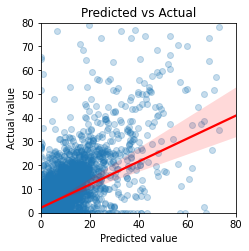

,Data,MAE,MSE,RMSE,R2
0,test,2.28,52.26,7.23,-0.0495


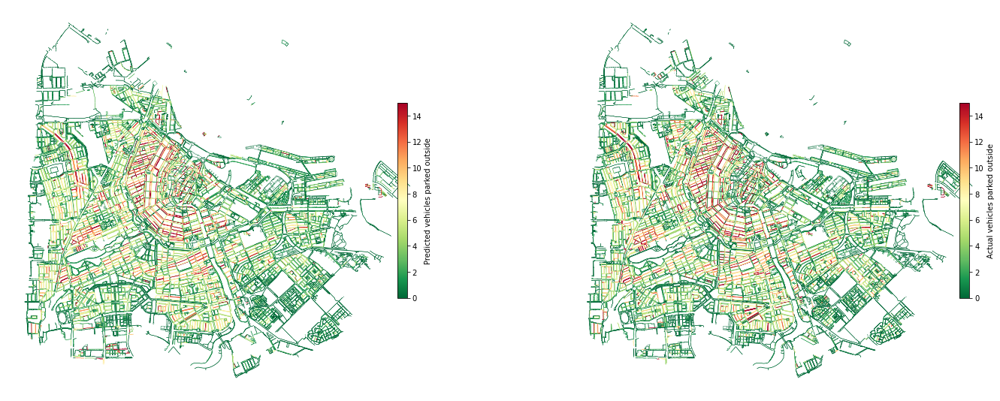

In [31]:
# Baseline
label = 'occupancy_outside_per_100m2'
pred = 'occupancy_outside_per_100m2_mean'

fig, ax = plt.subplots(1, sharex='none',sharey='none', figsize=(3.5,3.5))
sns.regplot(ax=ax, scatter_kws={'alpha':0.25}, data = test,  
            x = pred, y = label, line_kws = {'color' : 'red'}).set(title='Predicted vs Actual',xlabel='Predicted value', ylabel='Actual value',ylim=(0, 80), xlim=(0, 80))
plt.show()

errors = [get_statistics(test, pred, label, 'test')]    
error_df = pd.DataFrame(errors, columns = ['Data', 'MAE', 'MSE', 'RMSE', 'R2'])
display(error_df)

fig, axes = plt.subplots(1, 2, sharex='none',sharey='none', figsize=(22.5,7.5))
cmap = cm.RdYlGn
cmap_reversed = cmap.reversed()
axes[0].set_axis_off()
axes[1].set_axis_off()

test.dropna(subset=[label]).set_geometry('geometry_line').plot(linewidth = 0.4, ax=axes[0], cmap= cmap_reversed, column = pred, legend = True, aspect=1,  vmin = 0, vmax=15,
                                          legend_kwds={'label': 'Predicted vehicles parked outside','shrink': 0.5, 'pad':-0.05})
test.dropna(subset=[label]).set_geometry('geometry_line').plot(linewidth = 0.4, ax=axes[1], cmap= cmap_reversed, column = label, legend = True, aspect=1,  vmin = 0, vmax=15,
                                          legend_kwds={'label': 'Actual vehicles parked outside','shrink': 0.5, 'pad':-0.05})

fig.tight_layout(pad=1)
plt.show()

### 8.3 XGBoost

In [33]:
label = 'occupancy_outside_per_100m2'
model_name = 'XGBoost'
pred = 'pred_xgb'

param_grid  = {
    "colsample_bytree": np.arange(0.3, 0.8, 0.01),
    "gamma": np.arange(0, 0.8, 0.01),
    "learning_rate": np.arange(0.01, 0.6, 0.01), 
    "max_depth": np.arange(3, 13, 1),
    "n_estimators": np.arange(10, 150, 10),
    "subsample": np.arange(0.4, 0.9, 0.1)
}

**Only historical parking**

XGBoost


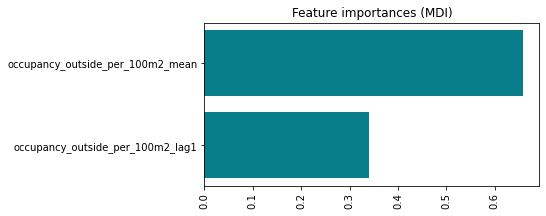

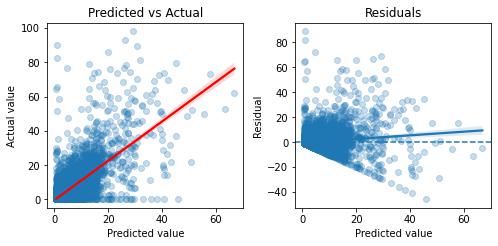

,Data,MAE,MSE,RMSE,R2
0,test,2.27,22.88,4.78,0.54
1,valid,2.12,16.81,4.10,0.19
2,train,1.75,11.43,3.38,0.56


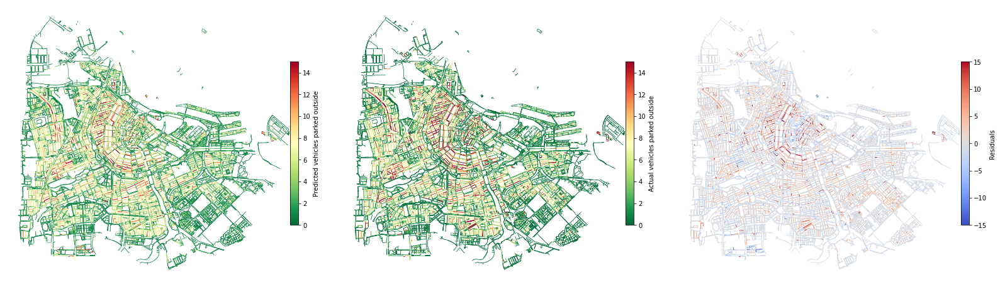

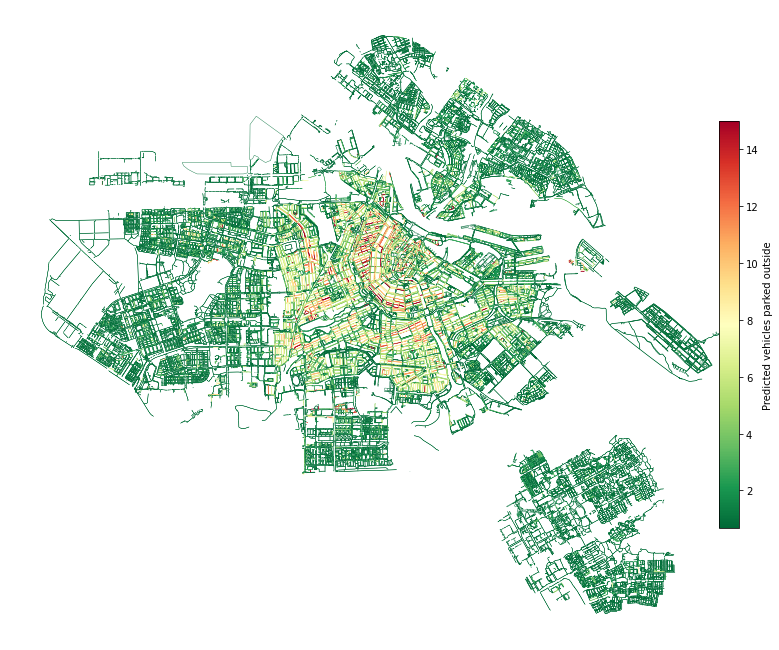

In [40]:
features = ['occupancy_outside_per_100m2_mean', 'occupancy_outside_per_100m2_lag1']

model = XGBRegressor(subsample= 0.4, n_estimators= 50, max_depth= 3, learning_rate= 0.11, gamma= 0.62, colsample_bytree= 0.53)

pred_xgb = train_eval_model(model_name, pred, model, train, test, False, None, label, features)

**Historical parking and neighborhood features**

In [4]:
features = ['occupancy_outside_per_100m2_mean', 'occupancy_outside_per_100m2_lag1',
            'capacity_mean','area', 'WON', 'VZN', 'WRK',
             'is_shopping_area_intersects', 'Healthcare_per_100m2', 'Metro', 'Tram',
             'Religion_per_100m2',
             'Offices_per_100m2',
             'Sports_per_100m2',
             'Retail_per_100m2',
             'Horeca_per_100m2',
             'Culture_per_100m2',
             'Lodging_per_100m2',
             'Education_per_100m2',
             'Companies_per_100m2',
             'Storage_per_100m2',
             'Public utility_per_100m2',
             'District center_per_100m2',
             'Cafe_per_100m2',
             'Restaurant_per_100m2',
             'Hotel_per_100m2',
             'Coffeeshop_per_100m2',
             'Fastfood_per_100m2',
             'Night shop_per_100m2']

model = XGBRegressor(subsample = 0.79, n_estimators= 70, max_depth= 4, learning_rate= 0.16, gamma= 0.16, colsample_bytree= 0.7)

pred_xgb = train_eval_model(model_name, pred, model, train, test, False, None, label, features)

**Historical parking and cluster features**

In [5]:
features = ['occupancy_outside_per_100m2_mean', 'occupancy_outside_per_100m2_lag1',
            'occupancy_outside_per_100m2_mean_mean','cluster']

model = XGBRegressor(subsample = 0.79, n_estimators= 70, max_depth= 4, learning_rate= 0.16, gamma= 0.16, colsample_bytree= 0.7)

pred_xgb = train_eval_model(model_name, pred, model, train, test, False, None, label, features)

**Historical parking, cluster and neighborhood features**

In [6]:
features = ['occupancy_outside_per_100m2_mean', 'occupancy_outside_per_100m2_lag1',
            'occupancy_outside_per_100m2_mean_mean', 'cluster',
            'capacity_mean','area', 'WON', 'VZN', 'WRK',
             'is_shopping_area_intersects', 'Healthcare_per_100m2', 'Metro', 'Tram',
             'Religion_per_100m2',
             'Offices_per_100m2',
             'Sports_per_100m2',
             'Retail_per_100m2',
             'Horeca_per_100m2',
             'Culture_per_100m2',
             'Lodging_per_100m2',
             'Education_per_100m2',
             'Companies_per_100m2',
             'Storage_per_100m2',
             'Public utility_per_100m2',
             'District center_per_100m2',
             'Cafe_per_100m2',
             'Restaurant_per_100m2',
             'Hotel_per_100m2',
             'Coffeeshop_per_100m2',
             'Fastfood_per_100m2',
             'Night shop_per_100m2']

model = XGBRegressor(subsample = 0.4, n_estimators= 60, max_depth= 3, learning_rate= 0.13, gamma= 0.23, colsample_bytree= 0.44)

pred_xgb = train_eval_model(model_name, pred, model, train, test, False, None, label, features)

**Neighborhood and cluster features**

In [7]:
features = ['occupancy_outside_per_100m2_mean_mean','cluster',
            'capacity_mean','area', 'WON', 'VZN', 'WRK',
             'is_shopping_area_intersects', 'Healthcare_per_100m2', 'Metro', 'Tram',
             'Religion_per_100m2',
             'Offices_per_100m2',
             'Sports_per_100m2',
             'Retail_per_100m2',
             'Horeca_per_100m2',
             'Culture_per_100m2',
             'Lodging_per_100m2',
             'Education_per_100m2',
             'Companies_per_100m2',
             'Storage_per_100m2',
             'Public utility_per_100m2',
             'District center_per_100m2',
             'Cafe_per_100m2',
             'Restaurant_per_100m2',
             'Hotel_per_100m2',
             'Coffeeshop_per_100m2',
             'Fastfood_per_100m2',
             'Night shop_per_100m2']

model = XGBRegressor(subsample = 0.6, n_estimators= 130, max_depth= 12, learning_rate= 0.34, gamma= 0.45, colsample_bytree= 0.57)

pred_xgb = train_eval_model(model_name, pred, model, train, test, False, None, label, features)

### 8.4 Random forest

In [59]:
model_name = 'Random forest regression'
pred = 'pred_rf'
label = 'occupancy_outside_per_100m2'

n_estimators = [5, 10, 25, 40, 50, 75, 100, 150, 200, 400, 600, 800, 1000] # default 100
criterion = ['mse','mae'] # default squared
max_depth = [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, None] # default None
min_samples_leaf = [1, 2, 3, 4, 5] # default 1
min_samples_split = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 15] # default 2
max_features = ['auto','sqrt','log2'] # default
bootstrap = [True, False] # default

param_grid = dict(n_estimators=n_estimators, criterion=criterion, max_depth=max_depth, min_samples_leaf=min_samples_leaf, min_samples_split=min_samples_split,max_features=max_features, bootstrap=bootstrap)

**Only historical parking**

In [8]:
features = ['occupancy_outside_per_100m2_mean', 'occupancy_outside_per_100m2_lag1', 'capacity_per_100m2_mean']

model = RandomForestRegressor(n_estimators= 100, min_samples_split=8, min_samples_leaf= 2, max_features= 'auto', max_depth= 60, criterion= 'mse', bootstrap= True)

pred_rf = train_eval_model(model_name, pred, model, train, test, False, None, label, features)

**Historical parking and neighborhood features**

Random forest regression


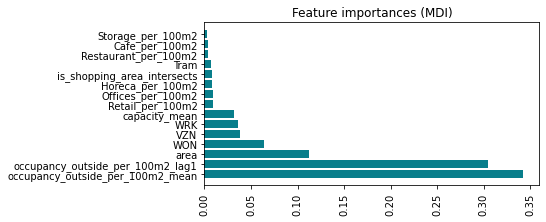

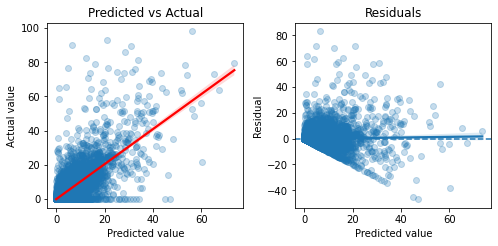

 
Error metrics


,Data,MAE,MSE,RMSE,R2
0,test,2.22,21.40,4.63,0.57
1,valid,1.60,12.38,3.52,0.40
2,train,1.22,6.00,2.45,0.77


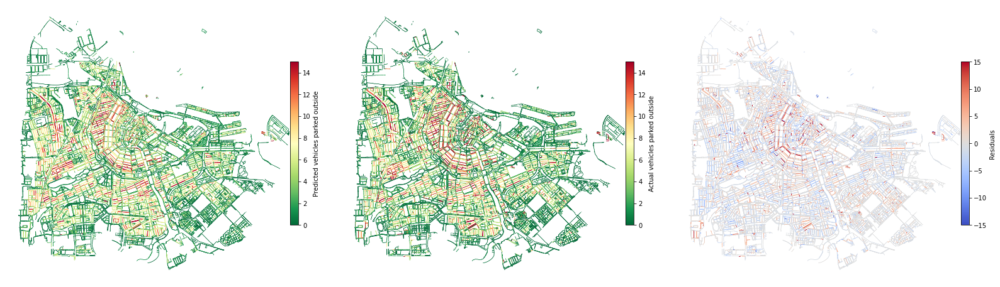

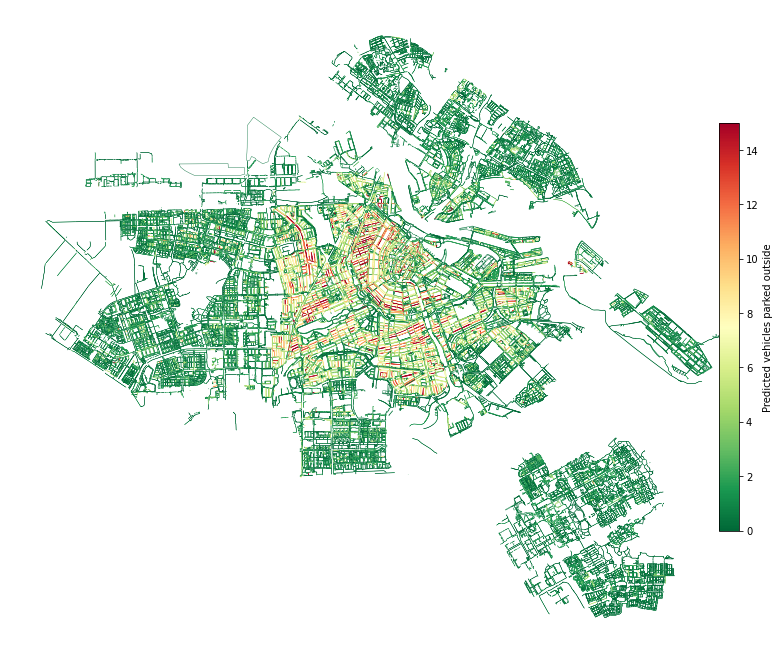

In [70]:
features = ['occupancy_outside_per_100m2_mean', 'occupancy_outside_per_100m2_lag1',
            'capacity_mean','area', 'WON', 'VZN', 'WRK',
             'is_shopping_area_intersects', 'Healthcare_per_100m2', 'Metro', 'Tram',
             'Religion_per_100m2',
             'Offices_per_100m2',
             'Sports_per_100m2',
             'Retail_per_100m2',
             'Horeca_per_100m2',
             'Culture_per_100m2',
             'Lodging_per_100m2',
             'Education_per_100m2',
             'Companies_per_100m2',
             'Storage_per_100m2',
             'Public utility_per_100m2',
             'District center_per_100m2',
             'Cafe_per_100m2',
             'Restaurant_per_100m2',
             'Hotel_per_100m2',
             'Coffeeshop_per_100m2',
             'Fastfood_per_100m2',
             'Night shop_per_100m2']

model = RandomForestRegressor(n_estimators= 40, min_samples_split=8, min_samples_leaf= 1, max_features= 'sqrt', max_depth= 60, criterion= 'mse', bootstrap= True)

pred_rf = train_eval_model(model_name, pred, model, train, test, False, None, label, features)

**Historical parking and cluster features**

In [9]:
features = ['occupancy_outside_per_100m2_mean', 'occupancy_outside_per_100m2_lag1',
            'occupancy_outside_per_100m2_mean_mean', 'cluster']

model = RandomForestRegressor(n_estimators= 70, min_samples_split=10, min_samples_leaf= 1, max_features= 'sqrt', max_depth= 4, criterion= 'mse', bootstrap= True)

pred_rf = train_eval_model(model_name, pred, model, train, test, False, None, label, features)

**Historical parking, cluster and neighborhood features**

In [10]:
features = ['occupancy_outside_per_100m2_mean', 'occupancy_outside_per_100m2_lag1',
            'occupancy_outside_per_100m2_mean_mean', 'cluster',
            'capacity_mean','area', 'WON', 'VZN', 'WRK',
             'is_shopping_area_intersects', 'Healthcare_per_100m2', 'Metro', 'Tram',
             'Religion_per_100m2',
             'Offices_per_100m2',
             'Sports_per_100m2',
             'Retail_per_100m2',
             'Horeca_per_100m2',
             'Culture_per_100m2',
             'Lodging_per_100m2',
             'Education_per_100m2',
             'Companies_per_100m2',
             'Storage_per_100m2',
             'Public utility_per_100m2',
             'District center_per_100m2',
             'Cafe_per_100m2',
             'Restaurant_per_100m2',
             'Hotel_per_100m2',
             'Coffeeshop_per_100m2',
             'Fastfood_per_100m2',
             'Night shop_per_100m2']

model = RandomForestRegressor(n_estimators= 200, min_samples_split=10, min_samples_leaf= 1, max_features= 'log2', max_depth= None, criterion= 'mse', bootstrap= True)

pred_rf = train_eval_model(model_name, pred, model, train, test, False, None, label, features)

**Cluster and neighborhood features**

In [11]:
features = ['occupancy_outside_per_100m2_mean_mean', 'cluster',
            'capacity_mean','area', 'WON', 'VZN', 'WRK',
             'is_shopping_area_intersects', 'Healthcare_per_100m2', 'Metro', 'Tram',
             'Religion_per_100m2',
             'Offices_per_100m2',
             'Sports_per_100m2',
             'Retail_per_100m2',
             'Horeca_per_100m2',
             'Culture_per_100m2',
             'Lodging_per_100m2',
             'Education_per_100m2',
             'Companies_per_100m2',
             'Storage_per_100m2',
             'Public utility_per_100m2',
             'District center_per_100m2',
             'Cafe_per_100m2',
             'Restaurant_per_100m2',
             'Hotel_per_100m2',
             'Coffeeshop_per_100m2',
             'Fastfood_per_100m2',
             'Night shop_per_100m2']

model = RandomForestRegressor(n_estimators= 50, min_samples_split=3, min_samples_leaf= 1, max_features= 'log2', max_depth= 60, criterion= 'mse', bootstrap= True)

pred_rf = train_eval_model(model_name, pred, model, train, test, False, None, label, features)

### 8.5 Multilayer perceptron

In [78]:
label = 'occupancy_outside_per_100m2'
model_name = 'MLP regression'
pred = 'pred_mlp'

hidden_layer_sizes = [(int(x),int(y),int(z)) for x in np.logspace(start = 0, stop = 2.2, num = 8) for y in np.logspace(start = 0, stop = 2.2, num = 8) for z in np.logspace(start = 0, stop = 2.2, num = 8)]
hidden_layer_sizes.extend((int(x),int(y)) for x in np.logspace(start = 0, stop = 2, num = 25) for y in np.logspace(start = 0, stop = 2, num = 25))
hidden_layer_sizes.extend((int(x),) for x in np.logspace(start = 1, stop = 2, num = 1000))    
# hidden_layer_sizes = [(100,100,100), (64,64,64), (100,10,), (1,10,), (50,100,50),(100,1,),(10,50,25)]
learning_rate = ['constant','adaptive']
max_iter = [100, 200, 300, 400, 500]
solver = ['adam','sgd']
activation = ['logistic', 'tanh', 'relu']
alpha = [0.0001, 0.001, 0.005, 0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.1]

param_grid = dict(hidden_layer_sizes=hidden_layer_sizes, activation=activation, learning_rate=learning_rate, max_iter=max_iter, solver=solver, alpha=alpha)

**Historical parking only**

In [15]:
features = ['occupancy_outside_per_100m2_mean', 'occupancy_outside_per_100m2_lag1']

model = MLPRegressor(solver='adam', max_iter=200,  learning_rate='constant', hidden_layer_sizes=(37, 8, 2), alpha=0.08, activation='tanh')

pred_mlp = train_eval_model(model_name, pred, model, train, test, False, None, label, features)

**Historical parking and neighborhood features**

In [14]:
features = ['occupancy_outside_per_100m2_mean', 'occupancy_outside_per_100m2_lag1',
            'capacity_per_100m2_mean', 'area', 'WON', 'VZN', 'WRK',
             'is_shopping_area_intersects', 'Tram',
             'Offices_per_100m2',
             'Retail_per_100m2',
             'Horeca_per_100m2',
             'Restaurant_per_100m2',
             'Hotel_per_100m2']

model = MLPRegressor(solver='adam', max_iter=400,  learning_rate='adaptive', hidden_layer_sizes=(100, 100, 100), alpha=0.04, activation='relu')

pred_mlp = train_eval_model(model_name, pred, model, train, test, False, None, label, features)

**Historical parking and cluster features**

In [13]:
features = ['occupancy_outside_per_100m2_mean', 'occupancy_outside_per_100m2_lag1',
            'occupancy_outside_per_100m2_mean_mean']

model = MLPRegressor(solver='adam', max_iter=200,  learning_rate='constant', hidden_layer_sizes=(64, 64, 64), alpha=0.01, activation='logistic')

pred_mlp = train_eval_model(model_name, pred, model, train, test, False, None, label, features)

**Historical parking, cluster and neighborhood features**

In [12]:
features = ['occupancy_outside_per_100m2_mean', 'occupancy_outside_per_100m2_lag1',
            'occupancy_outside_per_100m2_mean_mean',
            'capacity_per_100m2_mean', 'area', 'WON', 'VZN', 'WRK',
             'is_shopping_area_intersects', 'Tram',
             'Offices_per_100m2',
             'Retail_per_100m2',
             'Horeca_per_100m2',
             'Restaurant_per_100m2',
             'Hotel_per_100m2']
model = MLPRegressor(solver='adam', max_iter=300,  learning_rate='constant', hidden_layer_sizes=(64, 64, 64), alpha=0.01, activation='logistic')

pred_mlp = train_eval_model(model_name, pred, model, train, test, False, None, label, features)

**Cluster and neighborhood features**

MLP regression
No feature importances


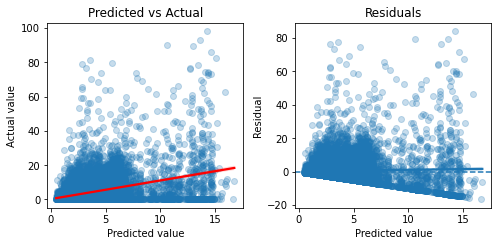

 
Error metrics


,Data,MAE,MSE,RMSE,R2
0,test,3.70,43.18,6.57,0.13
1,valid,2.99,21.02,4.58,-0.02
2,train,2.85,22.52,4.75,0.11


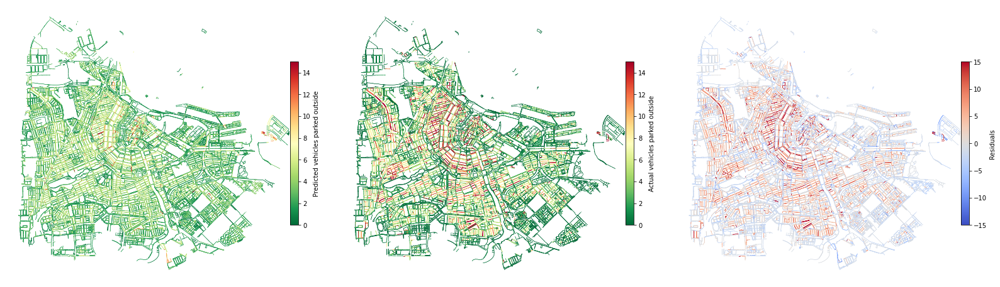

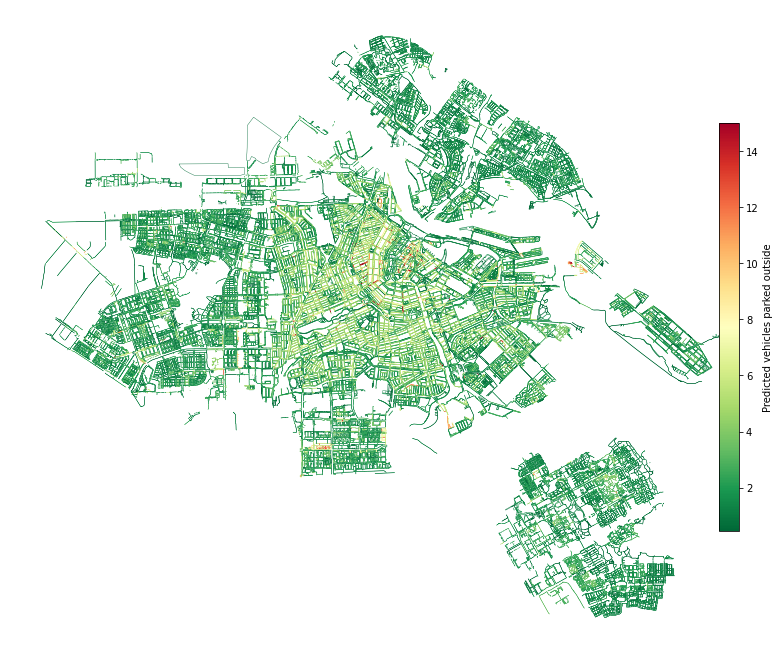

In [89]:
features = ['occupancy_outside_per_100m2_mean_mean',
            'capacity_per_100m2_mean', 'area', 'WON', 'VZN', 'WRK',
             'is_shopping_area_intersects', 'Tram',
             'Offices_per_100m2',
             'Retail_per_100m2',
             'Horeca_per_100m2',
             'Restaurant_per_100m2',
             'Hotel_per_100m2']

model = MLPRegressor(solver= 'adam', max_iter= 300, learning_rate= 'constant', hidden_layer_sizes= (100, 50, 100), alpha= 0.02, activation= 'logistic')

pred_mlp = train_eval_model(model_name, pred, model, train, test, False, None, label, features)

## 9 Parking insights and accessibility index

In [87]:
pred_rf.head()

,section_2018,street,geometry,geometry_line,area,year,occupancy_outside_per_100m2,pred_rf,pred_rf_resid
0,13793,Iepenplein,"POLYGON ((547095.956 6864733.318, 547095.956 6...","LINESTRING (547095.956 6864733.318, 547095.956...",278.401412,2021,11.135001,6.507387,4.627614
1,12744,NaN,"POLYGON ((549759.863 6863099.700, 549756.777 6...","LINESTRING (549759.863 6863099.700, 549756.777...",304.676539,2021,NaN,1.621235,NaN
2,21603,Beethovenstraat,"POLYGON ((542947.696 6862168.052, 542940.088 6...","LINESTRING (542947.696 6862168.052, 542940.088...",278.456574,2021,0.000000,0.692802,-0.692802
3,34596,NaN,"POLYGON ((537799.402 6868643.750, 537796.160 6...","LINESTRING (537799.402 6868643.750, 537796.160...",182.075899,2021,NaN,0.177169,NaN
4,15807,Europaplein,"POLYGON ((544434.867 6862393.999, 544434.867 6...","LINESTRING (544434.867 6862393.999, 544434.867...",4974.910719,2021,0.160807,0.430432,-0.269625


In [149]:
# Top 10 highest parking counts 2021
pred_rf.sort_values(by='occupancy_outside_per_100m2', ascending=False)[['street','occupancy_outside_per_100m2']].head(10)

,street,occupancy_outside_per_100m2
8764,0024 BRUG,98.173972
30363,Grimburgwal,92.909986
18962,Keizersgracht,89.847111
6733,MAGEREBRUG 0242,89.350919
10817,LELIESLUIS 061,85.996228
864,REESLUIS 0064,82.584044
2167,Roomolenstraat,81.289932
31728,Joos Banckersplantsoen,79.839755
12502,Hermietenstraat,78.948651
16663,Prinsengracht,78.251311


In [151]:
# Top 10 highest parking counts predictions
pred_rf.sort_values(by='pred_rf', ascending=False)[['street','pred_rf']].head(10)

,street,pred_rf
31728,Joos Banckersplantsoen,66.853790
24525,Joos Banckersplantsoen,61.972419
31066,LELIESLUIS 061,61.571316
16663,Prinsengracht,59.178421
14192,0216 BRUG,55.260304
8764,0024 BRUG,54.048537
15104,0054 BRUG,53.883749
21749,0056 BRUG,52.627747
5095,0056 BRUG,51.114595
717,Amstel,51.039245


In [153]:
# Top 5 biggest residuals (positive)
pred_rf.sort_values(by='pred_rf_resid', ascending=False)[['street','pred_rf_resid']].head(5)

,street,pred_rf_resid
18962,Keizersgracht,77.514765
864,REESLUIS 0064,73.454467
18377,Minnemoersstraat,72.299924
12502,Hermietenstraat,68.872171
30363,Grimburgwal,67.149369


In [154]:
# Top 5 biggest residuals (negative)
pred_rf.sort_values(by='pred_rf_resid', ascending=True)[['street','pred_rf_resid']].head(5)

,street,pred_rf_resid
26989,MAGEREBRUG 0242,-44.405657
25563,Lijnbaansgracht,-42.125569
21127,OUDEKERKSBRUG 206,-37.405941
275,Oudezijds Voorburgwal,-36.300476
8185,0005 BRUG,-35.157860


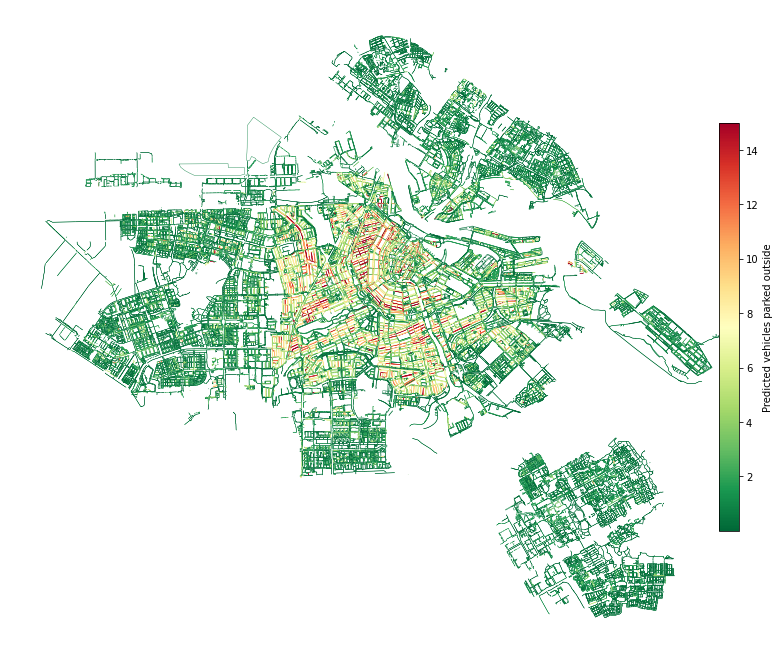

In [143]:
fig, ax = plt.subplots(1, sharex='none',sharey='none', figsize=(15,15))
ax.set_axis_off()
cmap = cm.RdYlGn
cmap_reversed = cmap.reversed()
pred_rf.set_geometry('geometry_line').plot(linewidth = 0.4, ax=ax, cmap= cmap_reversed, column = 'pred_rf', legend = True, aspect=1, vmax=15,
                                          legend_kwds={'label': 'Predicted vehicles parked outside','shrink': 0.5, 'pad':-0.05})
plt.show()

In [98]:
# Add categorical feature for the parking occupancy
def add_cat(df, feat):
    conditions = [
        (df[feat] >= 0) & (df[feat] < 6),
        (df[feat] >= 6) & (df[feat] < 12),
        (df[feat] >= 12) & (df[feat] < 18),
        (df[feat] >= 18)]
    choices = ['< 6', '6 > 12', '12 > 18', '> 18']
    df[feat + '_cat'] = np.select(conditions, choices, default=None)
    return df

In [104]:
pred_rf = add_cat(pred_rf, 'pred_rf')
pred_rf = add_cat(pred_rf, 'occupancy_outside_per_100m2')

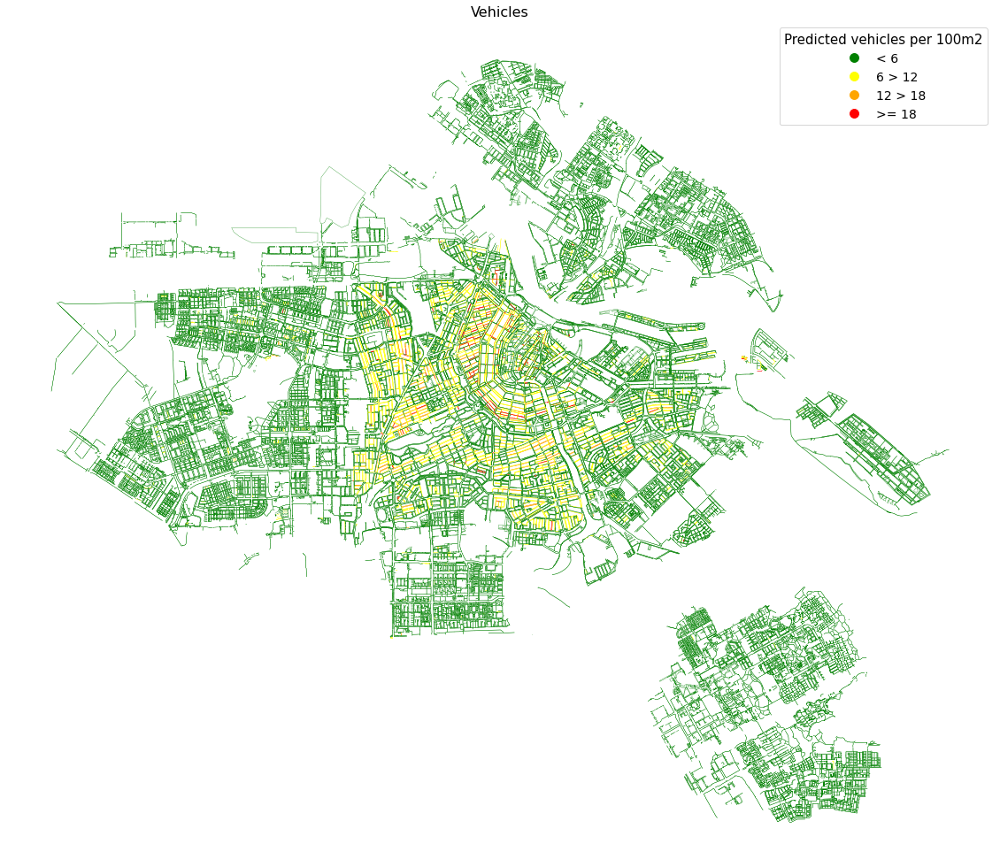

In [122]:
# Plot the predicted parking pccupancy
colorPalette = {'< 6': 'green', '6 > 12': 'yellow', '12 > 18': 'orange', '> 18' : 'red'}

fig, ax = plt.subplots(figsize=(20, 20))

for ctype, data in pred_rf.set_geometry('geometry_line').groupby('pred_rf_cat'):
    color = colorPalette[ctype]
    data.plot(color=color,
                      ax=ax,
                      label=ctype,
             linewidth=0.3)
    
ax.set_title("Vehicles", fontsize=16)
ax.set_axis_off()

legend_elements = [Line2D([0], [0], marker='o', color='w', label='< 6',
                              markerfacecolor='green', markersize=12),
                      Line2D([0], [0], marker='o', color='w', label='6 > 12',
                              markerfacecolor='yellow', markersize=12),
                       Line2D([0], [0], marker='o', color='w', label='12 > 18',
                              markerfacecolor='orange', markersize=12),
                       Line2D([0], [0], marker='o', color='w', label='>= 18',
                              markerfacecolor='red', markersize=12)]

ax.legend(handles=legend_elements, title='Predicted vehicles per 100m2',prop={'size': 14}, title_fontsize=15)
plt.show()

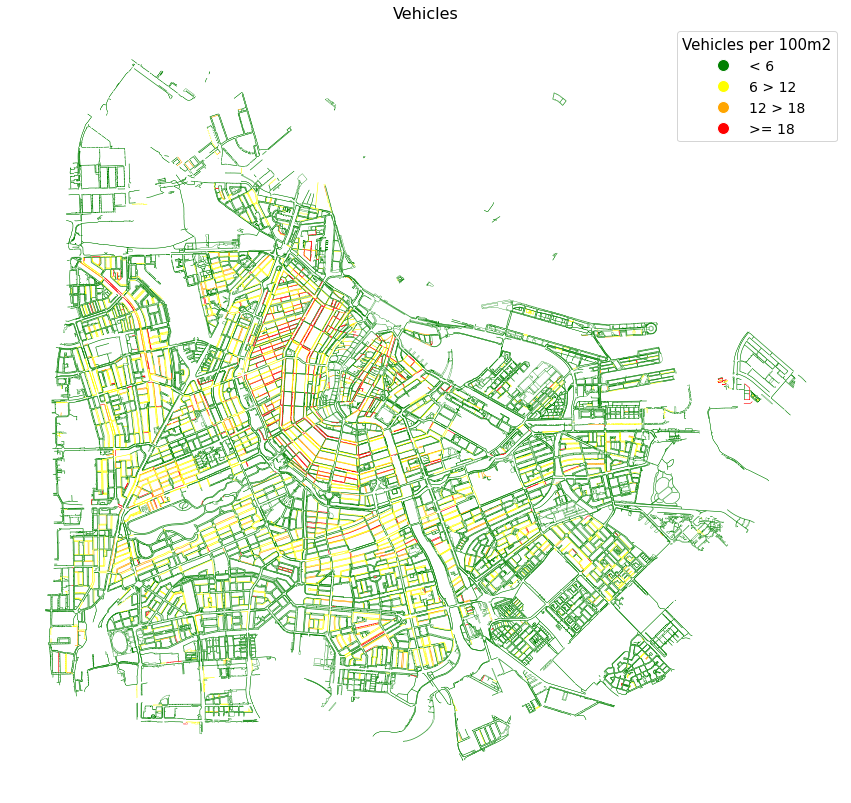

In [123]:
# Plot the actual parking pccupancy
colorPalette = {'< 6': 'green', '6 > 12': 'yellow', '12 > 18': 'orange', '> 18' : 'red'}

fig, ax = plt.subplots(figsize=(15, 15))

for ctype, data in pred_rf.set_geometry('geometry_line').groupby('occupancy_outside_per_100m2_cat'):
    color = colorPalette[ctype]
    data.plot(color=color,
                      ax=ax,
                      label=ctype,
             linewidth=0.3)
    
ax.set_title("Vehicles", fontsize=16)
ax.set_axis_off()

legend_elements = [Line2D([0], [0], marker='o', color='w', label='< 6',
                              markerfacecolor='green', markersize=12),
                      Line2D([0], [0], marker='o', color='w', label='6 > 12',
                              markerfacecolor='yellow', markersize=12),
                       Line2D([0], [0], marker='o', color='w', label='12 > 18',
                              markerfacecolor='orange', markersize=12),
                       Line2D([0], [0], marker='o', color='w', label='>= 18',
                              markerfacecolor='red', markersize=12)]

ax.legend(handles=legend_elements, title='Vehicles per 100m2',prop={'size': 14}, title_fontsize=15)
plt.show()

In [127]:
# Create accessibility index based on parking occupancy and sidewalk width
def add_acc_index(df, feat):
    for width in ['full_width', 'obstacle_free_width']:
        conditions = [
            (df[feat] == '< 6') & (df[width] == '>2.9m'),
            (df[feat] == '6 > 12') & (df[width] == '>2.9m'),
            (df[feat] == '12 > 18') & (df[width] == '>2.9m'),
            (df[feat] == '> 18') & (df[width] == '>2.9m'),

            (df[feat] == '< 6') & (df[width] == '1.8-2.9m'),
            (df[feat] == '6 > 12') & (df[width] == '1.8-2.9m'),
            (df[feat] == '12 > 18') & (df[width] == '1.8-2.9m'),
            (df[feat] == '> 18') & (df[width] == '1.8-2.9m'),

            (df[feat] == '< 6') & (df[width] == '0.9-1.8m'),
            (df[feat] == '6 > 12') & (df[width] == '0.9-1.8m'),
            (df[feat] == '12 > 18') & (df[width] == '0.9-1.8m'),
            (df[feat] == '> 18') & (df[width] == '0.9-1.8m'),

            (df[feat] == '< 6') & (df[width] == '<0.9m'),
            (df[feat] == '6 > 12') & (df[width] == '<0.9m'),
            (df[feat] == '12 > 18') & (df[width] == '<0.9m'),
            (df[feat] == '> 18') & (df[width] == '<0.9m')]

        choices = ['Excellent', 'Excellent', 'Good', 'Moderate',
                  'Good', 'Good', 'Moderate', 'Bad',
                  'Moderate', 'Moderate', 'Bad', 'Bad',
                  'Bad', 'Bad', 'Bad', 'Bad']
        df['access_index_' + width] = np.select(conditions, choices, default=None)
    return df

In [131]:
pred_rf = pred_rf.merge(test[['section_2018','full_width', 'obstacle_free_width']], how='left', on=['section_2018'])
pred_rf = add_acc_index(pred_rf, 'pred_rf_cat')
pred_rf.head()

,section_2018,street,geometry,geometry_line,area,year,occupancy_outside_per_100m2,pred_rf,pred_rf_resid,pred_rf_cat,occupancy_outside_per_100m2_cat,full_width,obstacle_free_width,access_index_full_width,access_index_obstacle_free_width
0,13793,Iepenplein,"POLYGON ((547095.956 6864733.318, 547095.956 6...","LINESTRING (547095.956 6864733.318, 547095.956...",278.401412,2021,11.135001,6.507387,4.627614,6 > 12,6 > 12,>2.9m,1.8-2.9m,Excellent,Good
1,12744,NaN,"POLYGON ((549759.863 6863099.700, 549756.777 6...","LINESTRING (549759.863 6863099.700, 549756.777...",304.676539,2021,NaN,1.621235,NaN,< 6,None,1.8-2.9m,1.8-2.9m,Good,Good
2,21603,Beethovenstraat,"POLYGON ((542947.696 6862168.052, 542940.088 6...","LINESTRING (542947.696 6862168.052, 542940.088...",278.456574,2021,0.000000,0.692802,-0.692802,< 6,< 6,>2.9m,unknown,Excellent,None
3,34596,NaN,"POLYGON ((537799.402 6868643.750, 537796.160 6...","LINESTRING (537799.402 6868643.750, 537796.160...",182.075899,2021,NaN,0.177169,NaN,< 6,None,0.9-1.8m,0.9-1.8m,Moderate,Moderate
4,15807,Europaplein,"POLYGON ((544434.867 6862393.999, 544434.867 6...","LINESTRING (544434.867 6862393.999, 544434.867...",4974.910719,2021,0.160807,0.430432,-0.269625,< 6,< 6,NaN,NaN,None,None


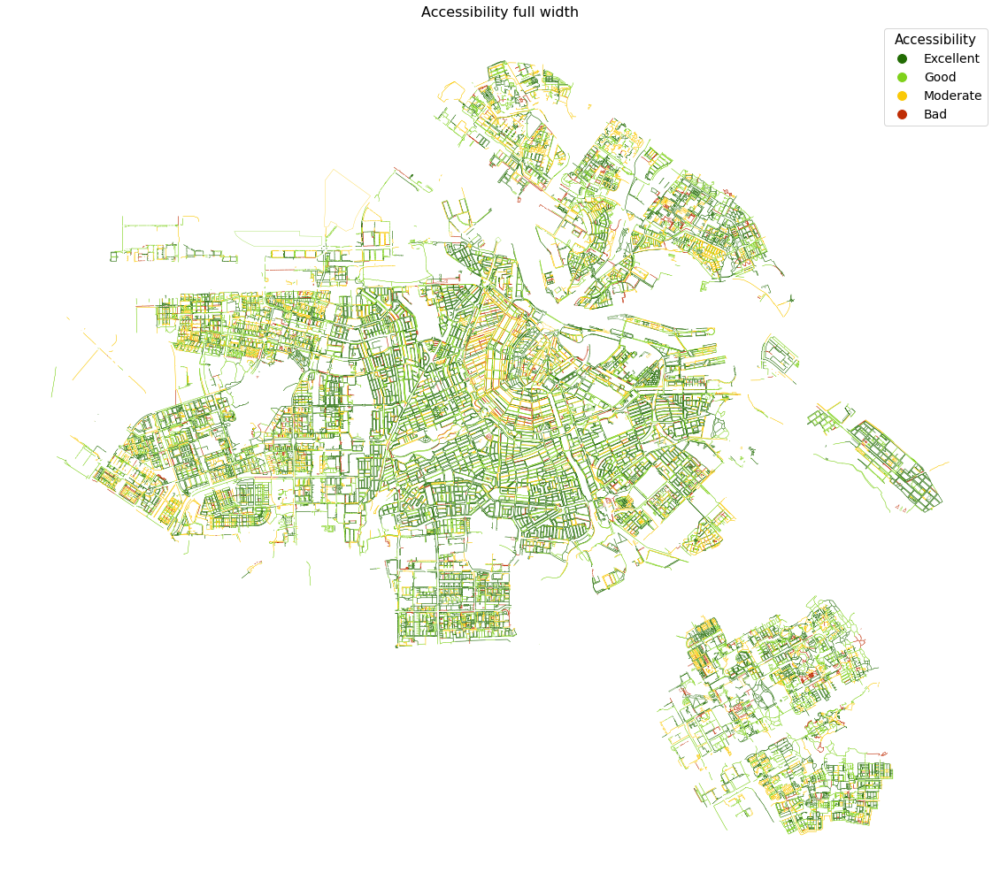

In [142]:
# Plot the accessibility index (full width)
colorPalette = {'Excellent': '#216b03', 'Good': '#7fd11b', 'Moderate': '#fac907', 'Bad' : '#bf2c04'}

fig, ax = plt.subplots(figsize=(20, 20))

for ctype, data in pred_rf.set_geometry('geometry_line').groupby('access_index_full_width'):
    color = colorPalette[ctype]
    data.plot(color=color,
                      ax=ax,
                      label=ctype,
             linewidth=0.3)
    
ax.set_title("Accessibility full width", fontsize=16)
ax.set_axis_off()

legend_elements = [Line2D([0], [0], marker='o', color='w', label='Excellent',
                              markerfacecolor='#216b03', markersize=12),
                      Line2D([0], [0], marker='o', color='w', label='Good',
                              markerfacecolor='#7fd11b', markersize=12),
                       Line2D([0], [0], marker='o', color='w', label='Moderate',
                              markerfacecolor='#fac907', markersize=12),
                       Line2D([0], [0], marker='o', color='w', label='Bad',
                              markerfacecolor='#bf2c04', markersize=12)]

ax.legend(handles=legend_elements, title='Accessibility',prop={'size': 14}, title_fontsize=15)
plt.show()

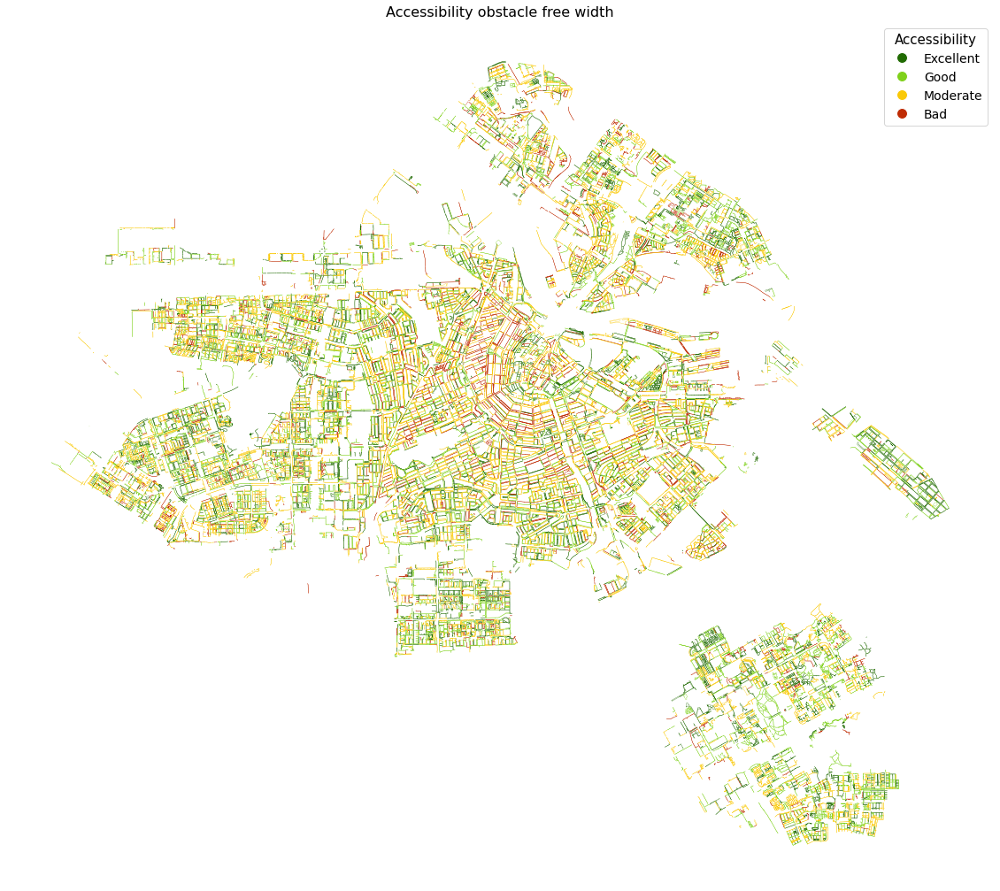

In [140]:
# Plot the accessibility index (obstacel free width)
colorPalette = {'Excellent': '#216b03', 'Good': '#7fd11b', 'Moderate': '#fac907', 'Bad' : '#bf2c04'}

fig, ax = plt.subplots(figsize=(20, 20))

for ctype, data in pred_rf.set_geometry('geometry_line').groupby('access_index_obstacle_free_width'):
    color = colorPalette[ctype]
    data.plot(color=color,
                      ax=ax,
                      label=ctype,
             linewidth=0.3)
    
ax.set_title("Accessibility obstacle free width", fontsize=16)
ax.set_axis_off()

legend_elements = [Line2D([0], [0], marker='o', color='w', label='Excellent',
                              markerfacecolor='#216b03', markersize=12),
                      Line2D([0], [0], marker='o', color='w', label='Good',
                              markerfacecolor='#7fd11b', markersize=12),
                       Line2D([0], [0], marker='o', color='w', label='Moderate',
                              markerfacecolor='#fac907', markersize=12),
                       Line2D([0], [0], marker='o', color='w', label='Bad',
                              markerfacecolor='#bf2c04', markersize=12)]

ax.legend(handles=legend_elements, title='Accessibility',prop={'size': 14}, title_fontsize=15)
plt.show()

In [144]:
# Save predictions and accessibility index
pred_rf.drop('geometry_line', axis=1).to_csv(main_path + "predictions_access_index.csv", index = False)